In [98]:
import os
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
import lsst.geom
afwDisplay.setDefaultBackend('matplotlib')
import matplotlib.ticker as plticker
from astropy.visualization import (ZScaleInterval, SqrtStretch, ImageNormalize)

In [99]:
comRepo = '/project/mrawls/hits2015/rerun/comparewarp3'
butlerCom = dafPersist.Butler(comRepo)
comTemplateRepo = '/project/mrawls/hits2014/coadds_comparewarp'
butlerComTemplate = dafPersist.Butler(comTemplateRepo)

In [100]:
def load_database(repo, sqliteFile='association.db'):
    connection = sqlite3.connect(os.path.join(repo, sqliteFile))
    tables = {'obj': 'DiaObject', 'src': 'DiaSource', 'ccd': 'CcdVisit'}

    # only choose objects with validityEnd NULL because that means they are still valid
    objTable = pd.read_sql_query('select diaObjectId, ra, decl, nDiaSources, gPSFluxMean, validityEnd, flags from {0} where validityEnd is NULL;'.format(tables['obj']), connection)
    srcTable = pd.read_sql_query('select diaSourceId, diaObjectId, ccdVisitId, flags from {0};'.format(tables['src']), connection)

    connection.close()
    return(objTable, srcTable)

In [101]:
objTableCom, srcTableCom = load_database(comRepo)

In [102]:
good_objects = ((objTableCom['nDiaSources'] > 14) & (objTableCom['flags'] == 0))

<IPython.core.display.Javascript object>


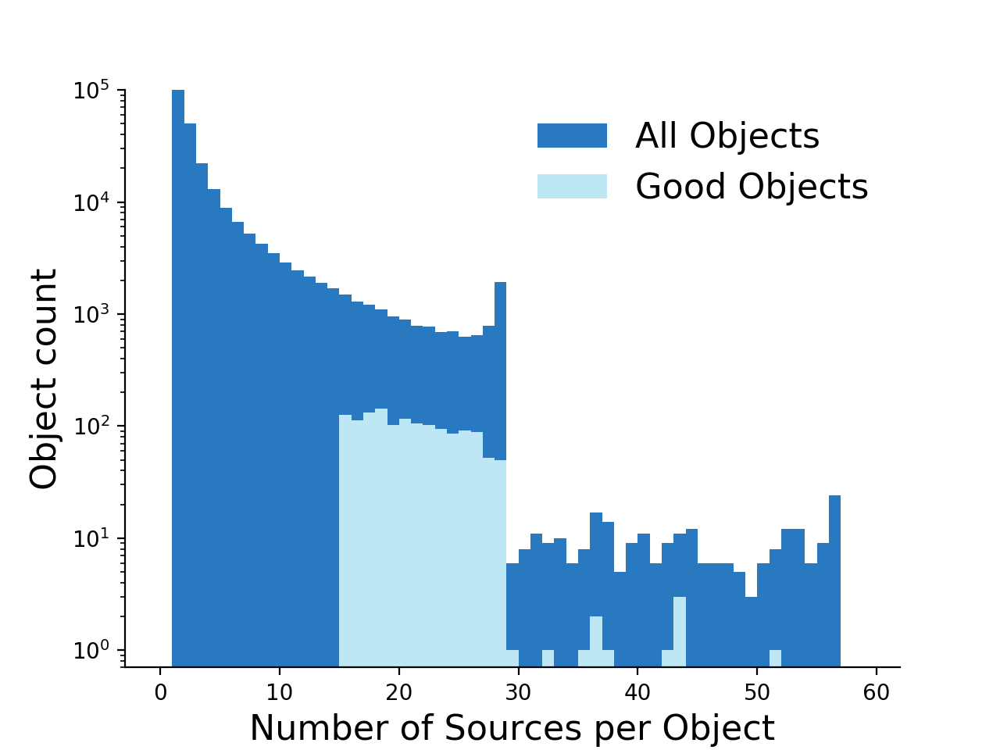

In [315]:
plt.figure()
plt.xlabel('Number of Sources per Object', size=16)
plt.ylabel('Object count', size=16)
plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTableCom['nDiaSources'].values, bins=np.arange(0, 60), color='#2979C1', label='All Objects')
plt.hist(objTableCom.loc[good_objects, 'nDiaSources'].values, bins=np.arange(0, 60), color='#Bee7F5', label='Good Objects')
plt.legend(frameon=False, fontsize=16)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

In [225]:
def plot_objects(objTable, srcTable, title=''):
    fig = plt.figure(facecolor='white', figsize=(10,8))
    
    dec_set1 = (objTable['decl'] > -2)
    dec_set2 = ~dec_set1
    
    dec_set1 = (dec_set1 & (objTable['nDiaSources'] > 14) & (objTable['flags'] == 0))
    dec_set2 = (dec_set2 & (objTable['nDiaSources'] > 14) & (objTable['flags'] == 0))
    
    print(len(objTable.loc[dec_set1, 'diaObjectId']) + len(objTable.loc[dec_set2, 'diaObjectId']))
    
    plt.subplots_adjust(wspace=0.1, hspace=0)

    # Panel 1: one HiTS field, on the right
    #ax1 = plt.subplot2grid((5,11), (0,6), rowspan=4, colspan=5)
    ax1 = plt.subplot2grid((100,100), (0,55), rowspan=90, colspan=45)
    ax1.set_facecolor('white')
    plot1 = ax1.scatter(objTable.loc[dec_set1, 'ra'], objTable.loc[dec_set1, 'decl'], marker='.',
                      lw=0, s=objTable.loc[dec_set1, 'nDiaSources']*8, c=objTable.loc[dec_set1, 'nDiaSources'],
                      alpha=0.7, cmap='viridis', linewidth=0.5, edgecolor='k')
    plt.title(title, loc='left')
    plt.xlabel('RA (deg)', size=16)
    plt.ylabel('Dec (deg)', size=16)
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    ax1.invert_xaxis()  # RA should increase to the left
    loc = plticker.MultipleLocator(base=0.5) # this locator puts ticks at regular intervals
    ax1.yaxis.set_major_locator(loc)
    
    cb = fig.colorbar(plot1, orientation='horizontal', pad=0.3)
    cb.set_label('Number of Sources per Object', size=16)
    cb.set_clim(15, 52)
    cb.solids.set_edgecolor("face")
    cb.remove()

    # Panel 2: two (overlapping) HiTS fields, on the left
    #ax2 = plt.subplot2grid((5,11), (0,0), rowspan=5, colspan=6)
    ax2 = plt.subplot2grid((100,100), (0,0), rowspan=90, colspan=50)
    ax2.set_facecolor('white')
    plot2 = ax2.scatter(objTable.loc[dec_set2, 'ra'], objTable.loc[dec_set2, 'decl'], marker='.',
                      lw=0, s=objTable.loc[dec_set2, 'nDiaSources']*8, c=objTable.loc[dec_set2, 'nDiaSources'],
                      alpha=0.7, cmap='viridis', linewidth=0.5, edgecolor='k')
    plt.xlabel('RA (deg)', size=16)
    plt.ylabel('Dec (deg)', size=16)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.invert_xaxis()
    
    #cax = plt.subplot2grid((22,11), (12,6), colspan=10)
    cax = plt.subplot2grid((100,100), (60,55), rowspan=5, colspan=45)
    
    cb2 = fig.colorbar(plot2, cax=cax, orientation='horizontal', pad=0.1)
    cb2.set_label('Number of Sources per Object', size=16)
    cb2.set_clim(15, 52)
    cb2.solids.set_edgecolor("face")
    #cb2.remove()

<IPython.core.display.Javascript object>


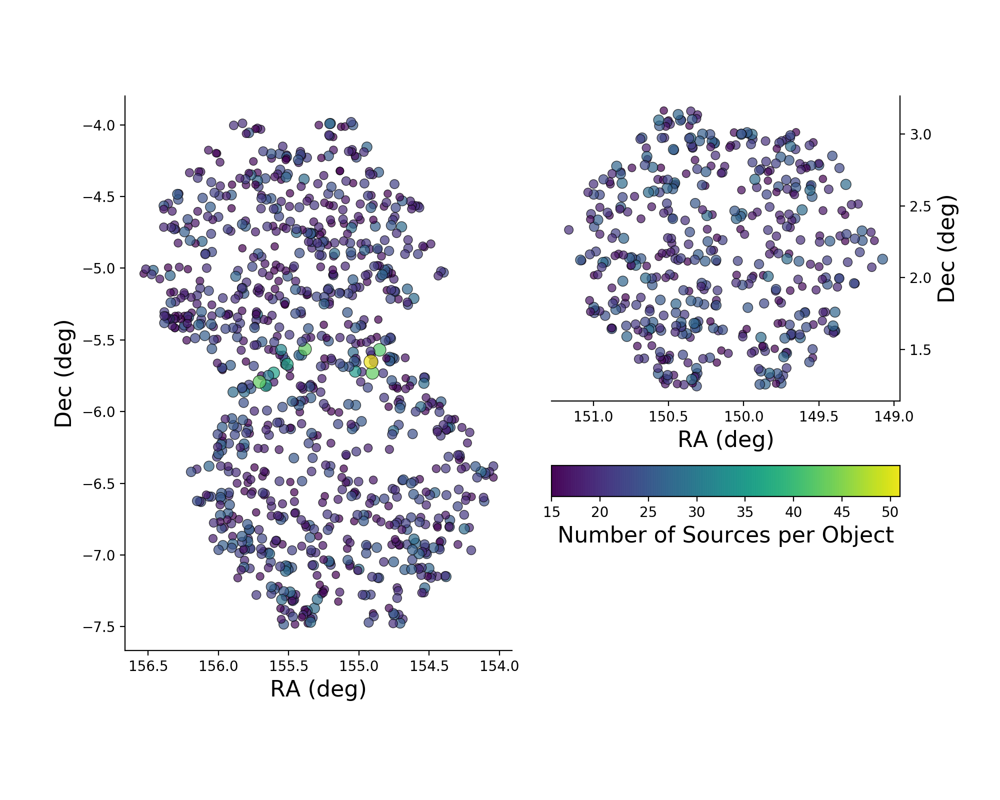

1414


In [226]:
plot_objects(objTableCom, srcTableCom)

In [103]:
def load_good_sources(repo, goodObj, sqliteFile='association.db'):
    connection = sqlite3.connect(os.path.join(repo, sqliteFile))
    tables = {'obj': 'DiaObject', 'src': 'DiaSource', 'ccd': 'CcdVisit'}

    # only choose objects with validityEnd NULL because that means they are still valid
    #objTable = pd.read_sql_query('select diaObjectId, ra, decl, nDiaSources, validityEnd, flags from {0} where validityEnd is NULL;'.format(tables['obj']), connection)
    goodSrc = pd.read_sql_query('select diaSourceId, diaObjectId, ccdVisitId, midPointTai, apFlux, psFlux, apFluxErr, psFluxErr, totFlux, totFluxErr, flags from {1} where diaObjectId = {0};'.format(goodObj, tables['src']), connection)

    connection.close()
    return(goodSrc)

In [104]:
better_objects = ((objTableCom['nDiaSources'] > 15) & (objTableCom['flags'] == 0) 
                  & (objTableCom['gPSFluxMean'] > 1.5e-9) & (objTableCom['gPSFluxMean'] < 2.0e-9))
len(objTableCom.loc[better_objects, 'diaObjectId'])

24

In [330]:
# Instead of using a manually defined patch list to figure out which patches
# have warps/coadds in them, go through each patch and try opening its coadd.
# If that succeeds, add the patch ID to our happy patch list.

dummyTemplateDataId = {'filter': 'g', 'patch': '11,9', 'tract': 0}  # arbitrary patch
patchList = []
skymap = butlerComTemplate.get('deepCoadd_skyMap', dataId=dummyTemplateDataId)

for tractInfo in skymap:
    good_patch_list = [str(patch.getIndex()[0]) + ',' + str(patch.getIndex()[1]) for patch in tractInfo]
    better_patch_list = []
    for patch in good_patch_list:
        try:
            dataId = {'filter': 'g', 'tract': 0, 'patch': patch}
            coadd_test = butlerComTemplate.get('deepCoadd', dataId=dataId)
        except:
            #print('No data in this patch', patch)
            continue
        else:
            print('This patch has a coadd', patch)
            patchList.append(patch)

This patch has a coadd 9,3
This patch has a coadd 10,3
This patch has a coadd 11,3
This patch has a coadd 12,3
This patch has a coadd 13,3
This patch has a coadd 9,4
This patch has a coadd 10,4
This patch has a coadd 11,4
This patch has a coadd 12,4
This patch has a coadd 13,4
This patch has a coadd 14,4
This patch has a coadd 8,5
This patch has a coadd 9,5
This patch has a coadd 10,5
This patch has a coadd 11,5
This patch has a coadd 12,5
This patch has a coadd 13,5
This patch has a coadd 14,5
This patch has a coadd 8,6
This patch has a coadd 9,6
This patch has a coadd 10,6
This patch has a coadd 11,6
This patch has a coadd 12,6
This patch has a coadd 13,6
This patch has a coadd 14,6
This patch has a coadd 9,7
This patch has a coadd 10,7
This patch has a coadd 11,7
This patch has a coadd 12,7
This patch has a coadd 13,7
This patch has a coadd 14,7
This patch has a coadd 8,8
This patch has a coadd 9,8
This patch has a coadd 10,8
This patch has a coadd 11,8
This patch has a coadd 12,8
T

In [332]:
len(patchList)

99

In [167]:
# so of course the template and processed/diffim images have different orientations...
# this function super needs documenting...

def plot_lightcurve(repo, obj, patch, findTemplatePatch=False, patchList=None,
                    addTotFlux=False, plotAllCutouts=False, cutoutIdx=0, labelCutouts=False):
    sources = load_good_sources(repo, obj)
    ra = objTableCom.loc[objTableCom['diaObjectId'] == obj, 'ra']
    dec = objTableCom.loc[objTableCom['diaObjectId'] == obj, 'decl']

    plt.figure()  # main lightcurve figure with cutouts above

    # light curve with psFlux by default (uses psFlux + totFlux if addTotFlux=True)
    plt.subplot(212)
    plt.xlabel('Time (MJD)', size=16)
    if not addTotFlux:
        plt.errorbar(sources['midPointTai'], sources['psFlux']*1e9, yerr=sources['psFluxErr']*1e9, 
                     ls=':', marker='o', color='#2979C1')
        plt.ylabel('Difference Flux (nJy)', size=16)
    else:
        addFlux = sources['psFlux']*1e9 + sources['totFlux']*1e9
        addFluxErr = np.sqrt((sources['psFluxErr']*1e9)**2 + (sources['totFluxErr']*1e9)**2)
        plt.errorbar(sources['midPointTai'], addFlux, yerr=addFluxErr, ls=':', marker='o', color='#2979C1')
        plt.ylabel('Flux (nJy)', size=16)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    
    dataIds = sources['ccdVisitId'].values  # these are ints
    dataIdDicts = []
    for dataId in dataIds:
        visit = int(str(dataId)[0:6])
        ccdnum = int(str(dataId)[6:])
        dataIdDict = {'visit': visit, 'ccdnum': ccdnum}
        dataIdDicts.append(dataIdDict)
    
    centerSource = lsst.geom.SpherePoint(ra, dec, lsst.geom.degrees)
    size = lsst.geom.Extent2I(30, 30)
    
    if findTemplatePatch:  # ignores input patch and searches patchList to find an acceptable patch instead
        for patch in patchList:
            templateDataId = {'filter': 'g', 'tract': 0, 'patch': patch}
            templateImage = butlerComTemplate.get('deepCoadd', dataId=templateDataId)
            try:
                cutout = templateImage.getCutout(centerSource, size)
            except:
                continue
            else:
                templatePatch = patch
                print('template patch:', templatePatch)
                print('object id:', obj)
                break
    
    # processed image
    plt.subplot(231)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Processed', size=16)
    calexpFirst = butlerCom.get('calexp', dataIdDicts[cutoutIdx])
    calexpArray = calexpFirst.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
    calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    plt.imshow(calexpArray, cmap='gray', norm=calexpNorm)
    
    # template image NEEDS TO BE ROTATED AND FLIPPED (order matters)
    plt.subplot(232)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Template', size=16)
    templateDataId = {'filter': 'g', 'tract': 0, 'patch': patch}
    template = butlerComTemplate.get('deepCoadd', dataId=templateDataId)
    templateArray = template.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
    templateNorm = ImageNormalize(templateArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    plt.imshow(np.fliplr(np.rot90(templateArray)), cmap='gray', norm=templateNorm)
    
    # difference image
    plt.subplot(233)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Difference', size=16)
    diffimFirst = butlerCom.get('deepDiff_differenceExp', dataIdDicts[cutoutIdx])
    diffimArray = diffimFirst.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
    diffimNorm = ImageNormalize(diffimArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    plt.imshow(diffimArray, cmap='gray', norm=diffimNorm)
    
    if plotAllCutouts:
        fig = plt.figure(figsize=(8,8))  # optional figure with cutouts for all visits
        fig.subplots_adjust(hspace=0, wspace=0)
        for idx, dataId in enumerate(dataIdDicts):
            calexp = butlerCom.get('calexp', dataId)
            diffim = butlerCom.get('deepDiff_differenceExp', dataId)
            calexpArray = calexp.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
            calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
            diffimArray = diffim.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
            diffimNorm = ImageNormalize(diffimArray, interval=ZScaleInterval(), stretch=SqrtStretch())
            
            plt.subplot(8,8,idx+1)
            plt.gca().get_xaxis().set_ticks([])
            plt.gca().get_yaxis().set_ticks([])
            plt.imshow(calexpArray, cmap='gray', norm=calexpNorm)
            if labelCutouts:
                if idx == 0:
                    plt.text(1, 26, 'Processed', color='lime')
                plt.text(2, 5, str(sources['midPointTai'][idx])[1:8], color='lime')
            
            plt.subplot(8,8,idx+32+1)
            plt.gca().get_xaxis().set_ticks([])
            plt.gca().get_yaxis().set_ticks([])
            plt.imshow(diffimArray, cmap='gray', norm=diffimNorm)
            if labelCutouts:
                if idx == 0:
                    plt.text(1, 26, 'Difference', color='lime')
                plt.text(2, 5, str(sources['midPointTai'][idx])[1:8], color='lime')

In [108]:
# manually defining the patchList generated above, because regenerating it is slow
patchList = ['9,3', '10,3', '11,3', '12,3', '13,3', '9,4', '10,4', '11,4', '12,4', '13,4', '14,4',
             '8,5', '9,5', '10,5', '11,5', '12,5', '13,5', '14,5', '8,6', '9,6', '10,6', '11,6',
             '12,6', '13,6', '14,6', '9,7', '10,7', '11,7', '12,7', '13,7', '14,7', '8,8', '9,8',
             '10,8', '11,8', '12,8', '13,8', '7,9', '8,9', '9,9', '10,9', '11,9', '12,9', '13,9',
             '7,10', '8,10', '9,10', '10,10', '11,10', '12,10', '13,10', '8,11', '9,11', '10,11',
             '11,11', '12,11', '13,11', '8,12', '9,12', '10,12', '11,12', '12,12', '9,13', '10,13',
             '11,13', '22,27', '23,27', '24,27', '25,27', '26,27', '27,27', '22,28', '23,28', '24,28',
             '25,28', '26,28', '27,28', '22,29', '23,29', '24,29', '25,29', '26,29', '27,29', '28,29',
             '22,30', '23,30', '24,30', '25,30', '26,30', '27,30', '28,30', '22,31', '23,31', '24,31',
             '25,31', '26,31', '27,31', '23,32', '24,32']

<IPython.core.display.Javascript object>


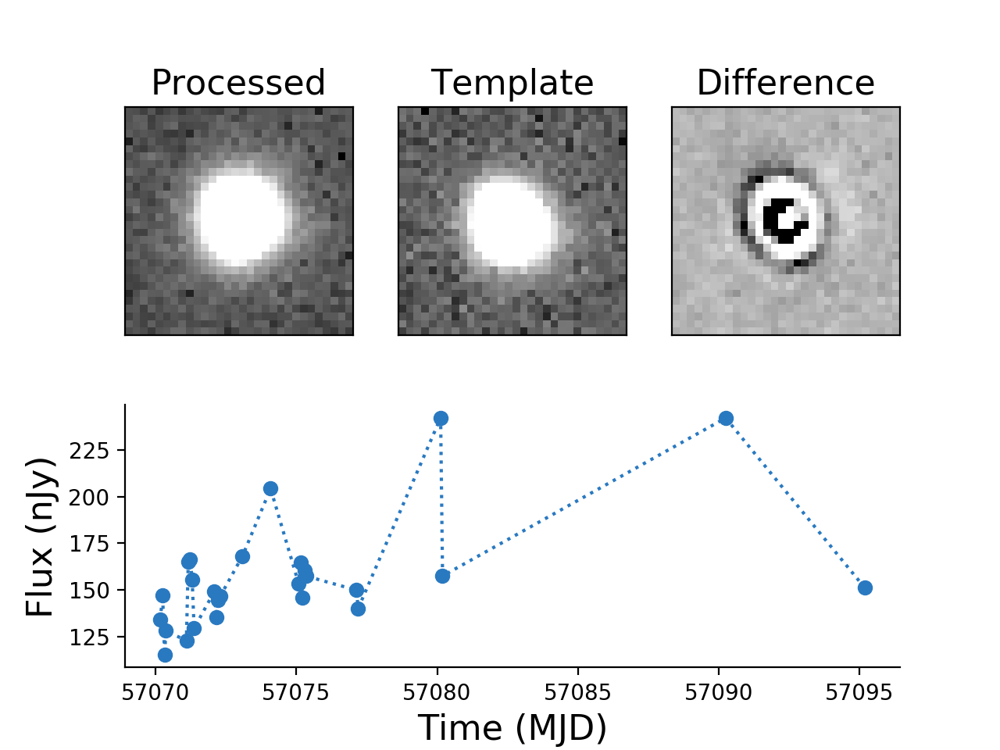

template patch: 8,9
object id: 176493735339623618


<IPython.core.display.Javascript object>


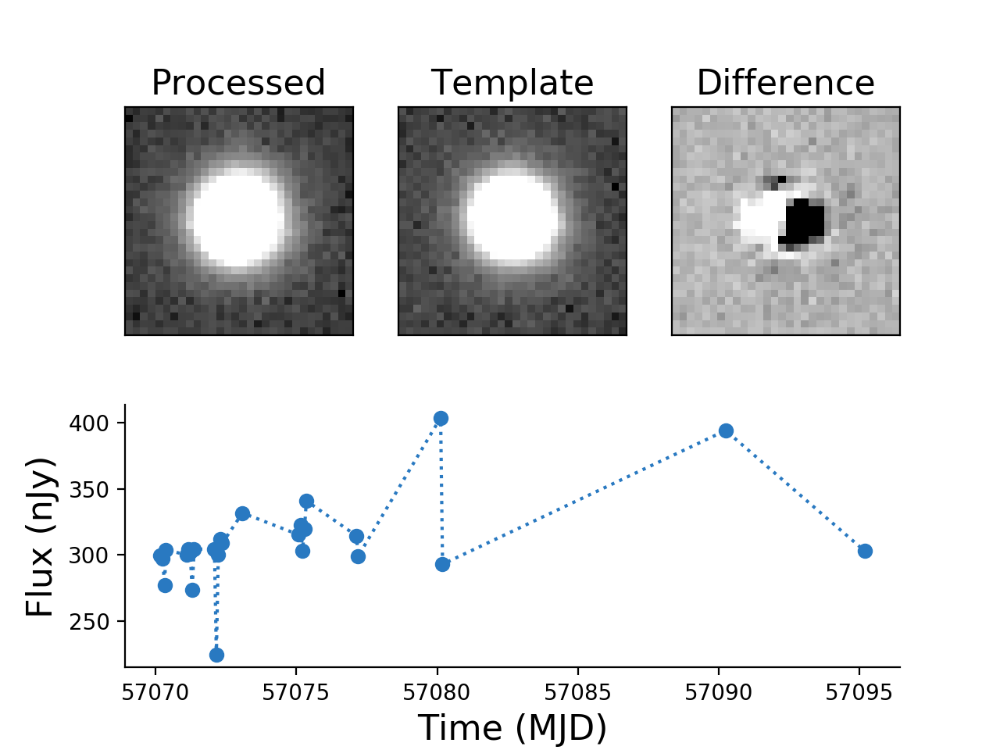

template patch: 12,10
object id: 176493606490604081


<IPython.core.display.Javascript object>


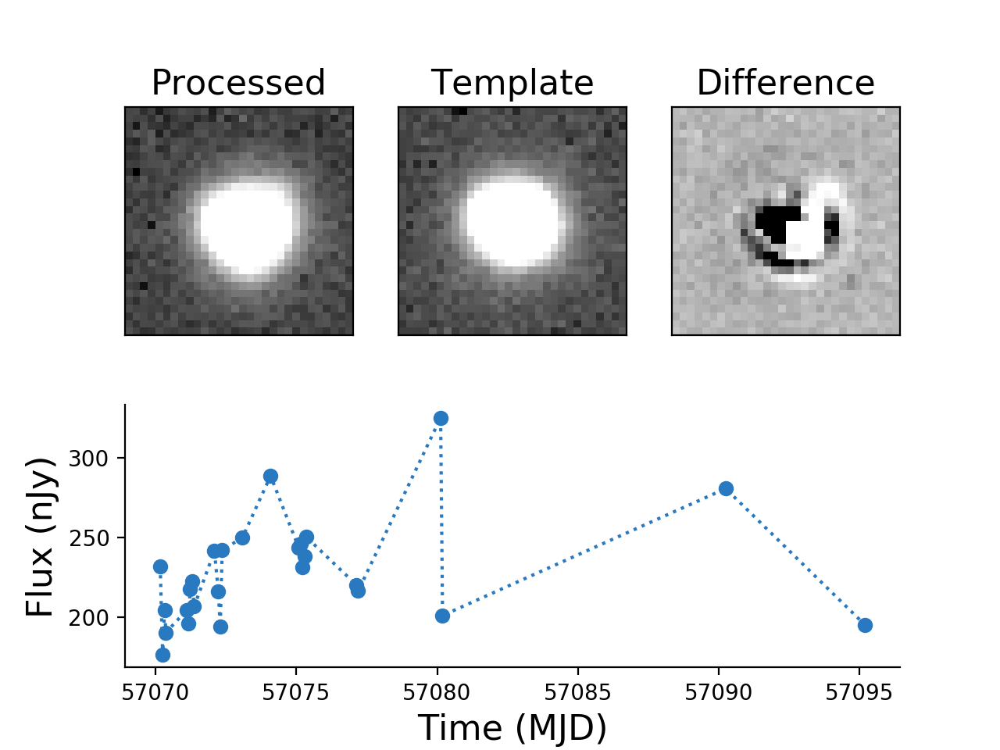

template patch: 9,7
object id: 176493786879230374


<IPython.core.display.Javascript object>


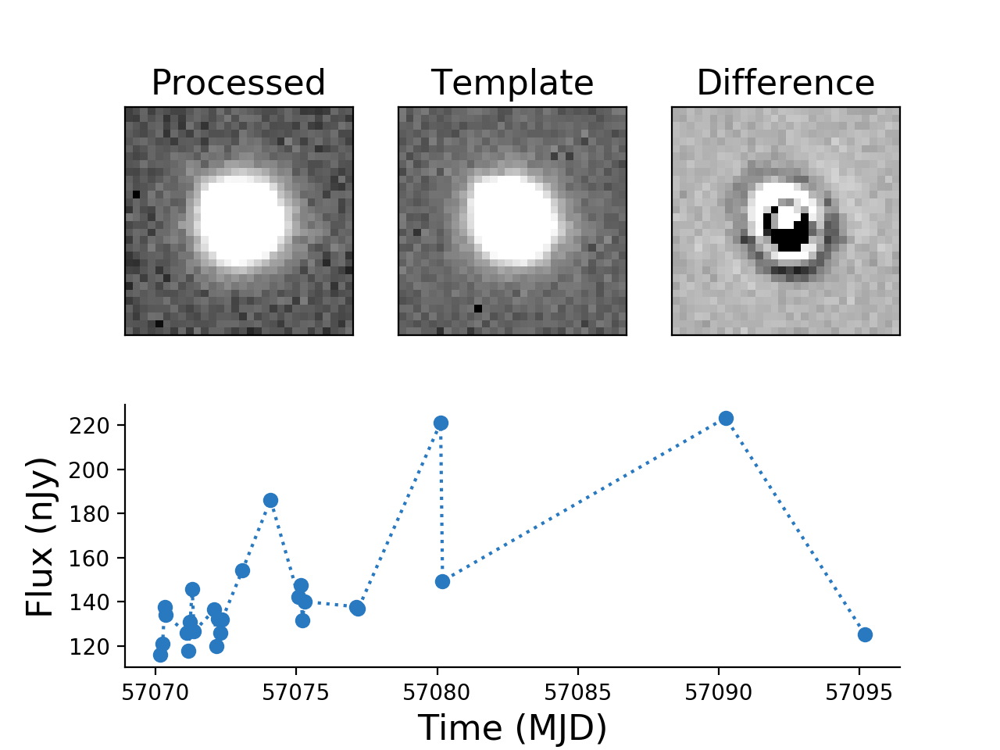

template patch: 8,8
object id: 176493756814459839


In [113]:
for obj in objTableCom.loc[better_objects, 'diaObjectId'].values[20::]:
    plot_lightcurve(comRepo, obj, patch=None, addTotFlux=True, findTemplatePatch=True,
                    patchList=patchList, plotAllCutouts=False)

<IPython.core.display.Javascript object>


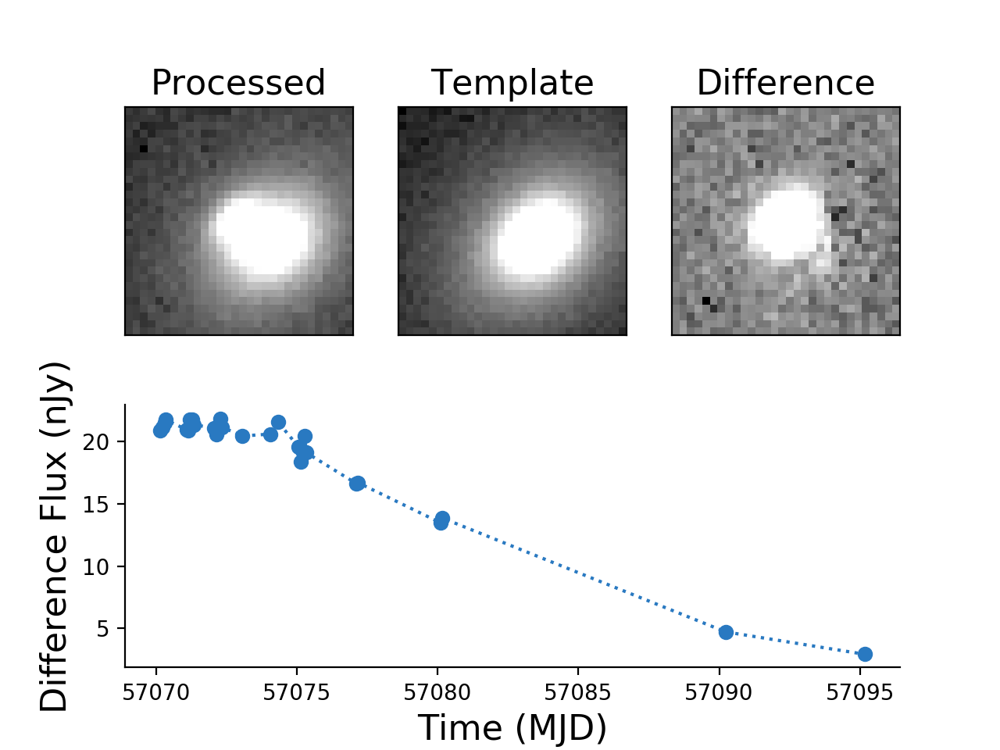

<IPython.core.display.Javascript object>


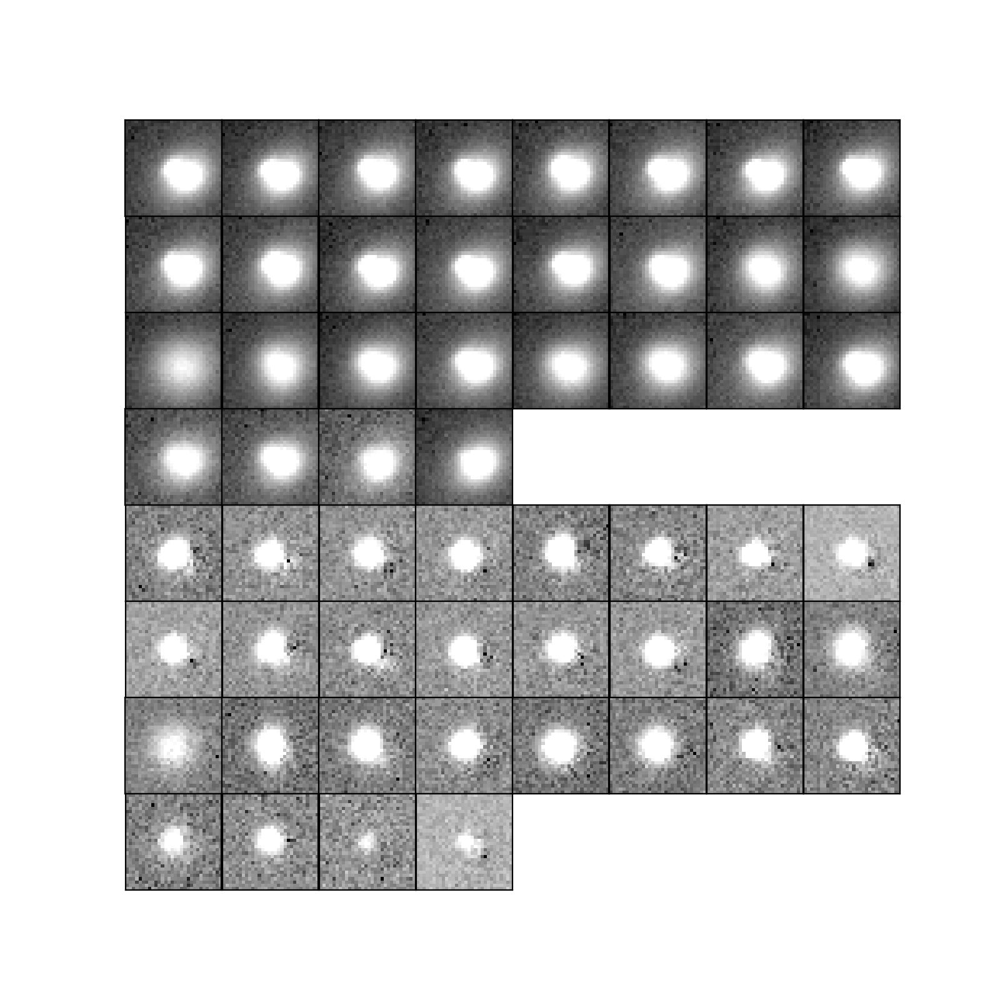

In [170]:
miniObjList = [176486906341621918, 176492915000869081, 176492859166294239, 176492927885771012, 176486906341621930]
miniPatchList = ['25,27', '10,3', '12,5', '10,3', '25,27']
 
plot_lightcurve(comRepo, miniObjList[0], miniPatchList[0], addTotFlux=False, plotAllCutouts=True)
#plot_lightcurve(comRepo, miniObjList[1], miniPatchList[1], addTotFlux=True, plotAllCutouts=True)
#plot_lightcurve(comRepo, miniObjList[2], miniPatchList[2], addTotFlux=True, plotAllCutouts=True)
#plot_lightcurve(comRepo, miniObjList[3], miniPatchList[3], addTotFlux=True, plotAllCutouts=True)
#plot_lightcurve(comRepo, miniObjList[4], miniPatchList[4], addTotFlux=True, plotAllCutouts=True)

<IPython.core.display.Javascript object>


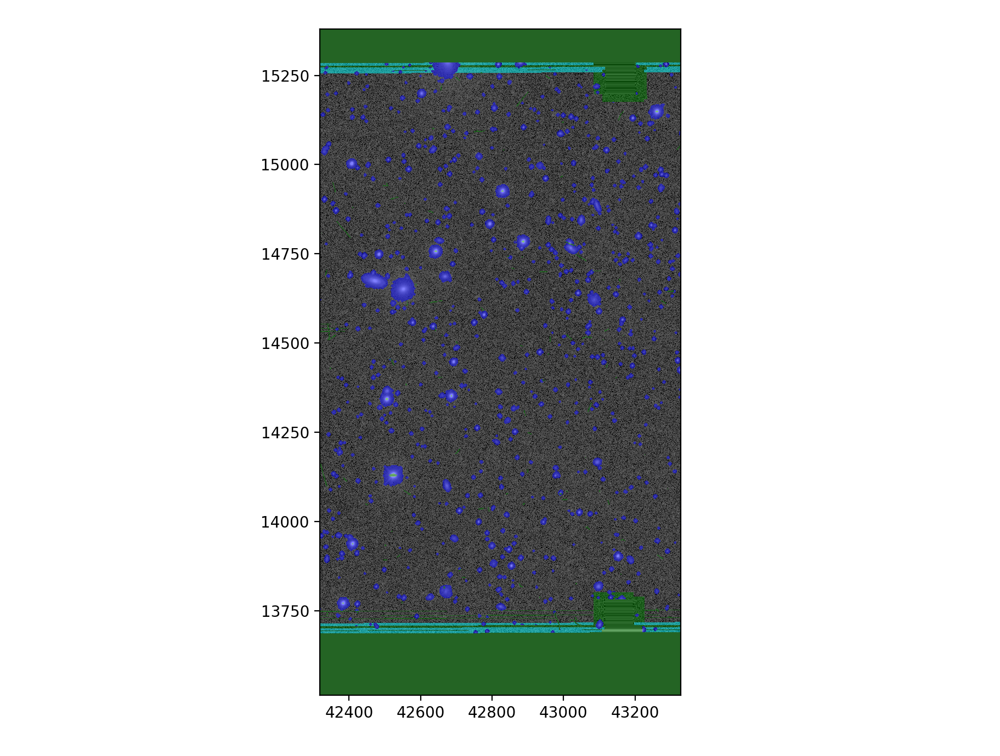

In [341]:
disp1 = afwDisplay.Display(50)
disp1.setMaskTransparency(50)
disp1.scale('asinh', 'zscale', Q=8)
disp1.mtv(template)

/opt/lsst/software/stack/python/miniconda3-4.5.4/envs/lsst-scipipe-fcd27eb/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


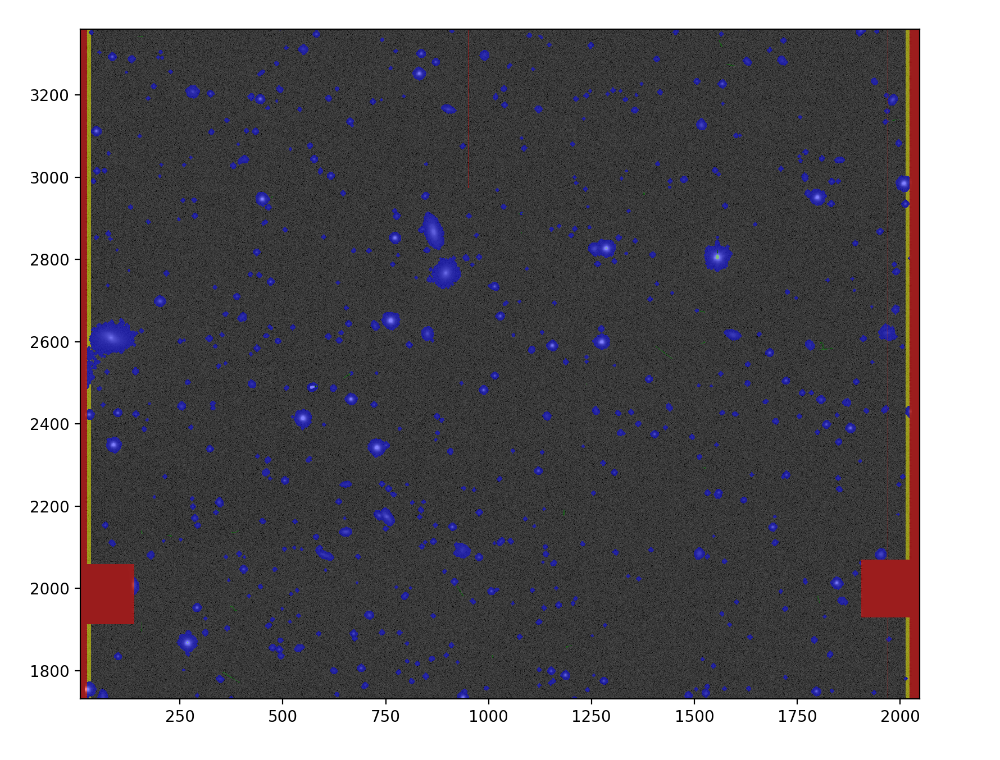

In [342]:
disp1 = afwDisplay.Display(51)
disp1.setMaskTransparency(50)
disp1.scale('asinh', 'zscale', Q=8)
disp1.mtv(calexpFirst)

<IPython.core.display.Javascript object>


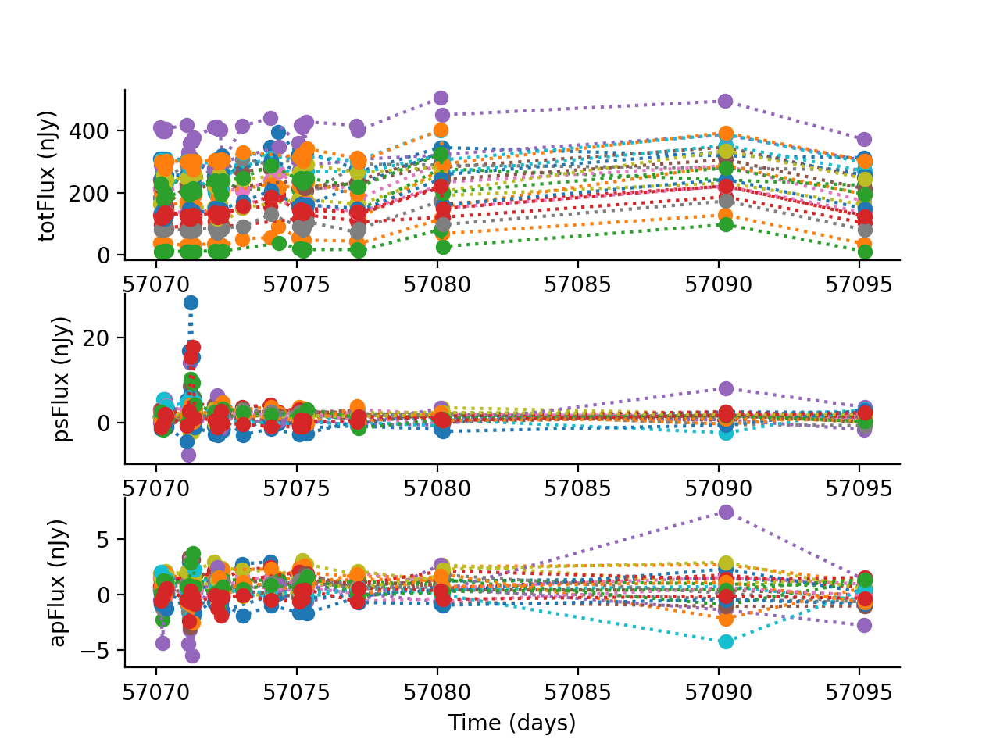

In [97]:
plt.figure()
for obj in objTableCom.loc[better_objects, 'diaObjectId'].values:
    sources = load_good_sources(comRepo, obj)
    ra = objTableCom.loc[objTableCom['diaObjectId'] == obj, 'ra']
    dec = objTableCom.loc[objTableCom['diaObjectId'] == obj, 'decl']

    plt.subplot(311)
    #plt.xlabel('Time (MJD)')
    plt.errorbar(sources['midPointTai'], sources['totFlux']*1e9, yerr=sources['totFluxErr']*1e9, 
                 ls=':', marker='o')
    plt.ylabel('totFlux (nJy)')
#    else:
#        addFlux = sources['psFlux']*1e9 + sources['totFlux']*1e9
#        addFluxErr = np.sqrt((sources['psFluxErr']*1e9)**2 + (sources['totFluxErr']*1e9)**2)
#        plt.errorbar(sources['midPointTai'], addFlux, yerr=addFluxErr, ls=':', marker='o', color='#2979C1')
#        plt.ylabel('Flux (nJy)', size=16)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    
    plt.subplot(312)
    plt.errorbar(sources['midPointTai'], sources['psFlux']*1e9, yerr=sources['psFluxErr']*1e9, 
                 ls=':', marker='o')
    #plt.xlabel('Time (MJD)')
    plt.ylabel('psFlux (nJy)')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    
    plt.subplot(313)
    plt.errorbar(sources['midPointTai'], sources['apFlux']*1e9, yerr=sources['apFluxErr']*1e9, 
                 ls=':', marker='o')
    plt.xlabel('Time (MJD)')
    plt.ylabel('apFlux (nJy)')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

In [160]:
# new plan: I have the RAs and Decs for legit variable identified by the HiTS DR

ra_var_list = [149.261780, 149.361376, 149.619965, 149.686132, 149.826402, 150.644567, 
               154.412797, 154.415591, 154.583080, 154.667438, 154.674611, 154.847320, 154.874207, 
               155.215069, 155.218571, 155.355072, 155.783862, 155.862290, 156.133920, 156.310131]

dec_var_list = [2.607883, 1.932343, 2.634973, 2.521686, 2.718168, 2.843686, -5.987447, -6.991039, 
                -6.643702, -6.640005, -7.069826, -7.148611, -4.685019, -7.042953, -3.972219, 
                -7.071338, -4.337208, -4.683299, -4.697616, -4.464279]

for ra_var, dec_var in zip(ra_var_list, dec_var_list):
    coordcut = (objTableCom['ra'] > ra_var-0.01) & (objTableCom['ra'] < ra_var+0.01) & \
               (objTableCom['decl'] > dec_var-0.01) & (objTableCom['decl'] < dec_var+0.01) &\
               (objTableCom['nDiaSources'] > 26)

    print(objTableCom.loc[coordcut, 'diaObjectId'], objTableCom.loc[coordcut, 'flags'])

Series([], Name: diaObjectId, dtype: int64) Series([], Name: flags, dtype: int64)
427635    176486816147309064
Name: diaObjectId, dtype: int64 427635    1
Name: flags, dtype: int64
432275    176486708773126551
Name: diaObjectId, dtype: int64 432275    1
Name: flags, dtype: int64
Series([], Name: diaObjectId, dtype: int64) Series([], Name: flags, dtype: int64)
Series([], Name: diaObjectId, dtype: int64) Series([], Name: flags, dtype: int64)
431312    176486700183191880
Name: diaObjectId, dtype: int64 431312    0
Name: flags, dtype: int64
Series([], Name: diaObjectId, dtype: int64) Series([], Name: flags, dtype: int64)
439448    176492854871327035
Name: diaObjectId, dtype: int64 439448    1
Name: flags, dtype: int64
443319    176492803331719390
Name: diaObjectId, dtype: int64 443319    1
Name: flags, dtype: int64
440043    176492807626686723
Name: diaObjectId, dtype: int64 440043    1
Name: flags, dtype: int64
437513    176492884936098076
Name: diaObjectId, dtype: int64 437513    1
Name:

In [161]:
var_obj_list = [176486700183191880, 176492889231065571]

eb_objs = [176493623670473009, 176492884936098076, 176492807626686723, 176486700183191880, 176492889231065571]
# all are promising; first 3 are EBs with flags, last 2 have no flags
eb_patches = ['8,10', '12,4', '12,5', '23,31', '11,4']

<IPython.core.display.Javascript object>


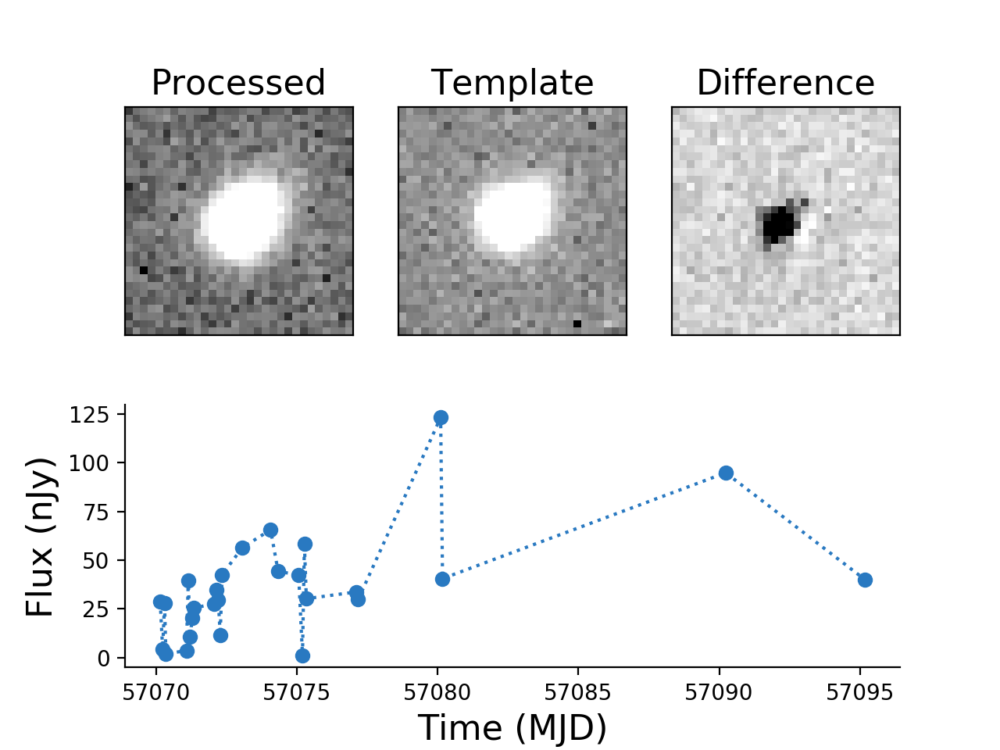

template patch: 23,31
object id: 176486700183191880


<IPython.core.display.Javascript object>


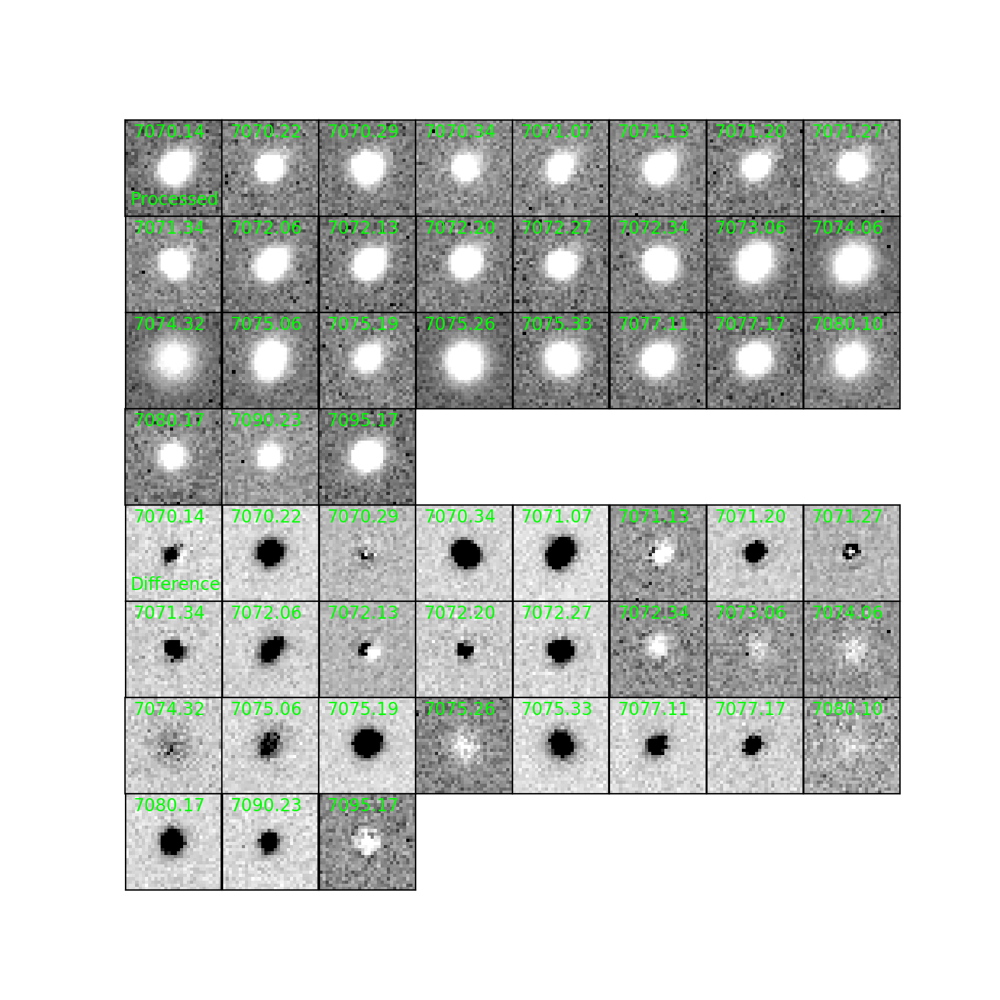

<IPython.core.display.Javascript object>


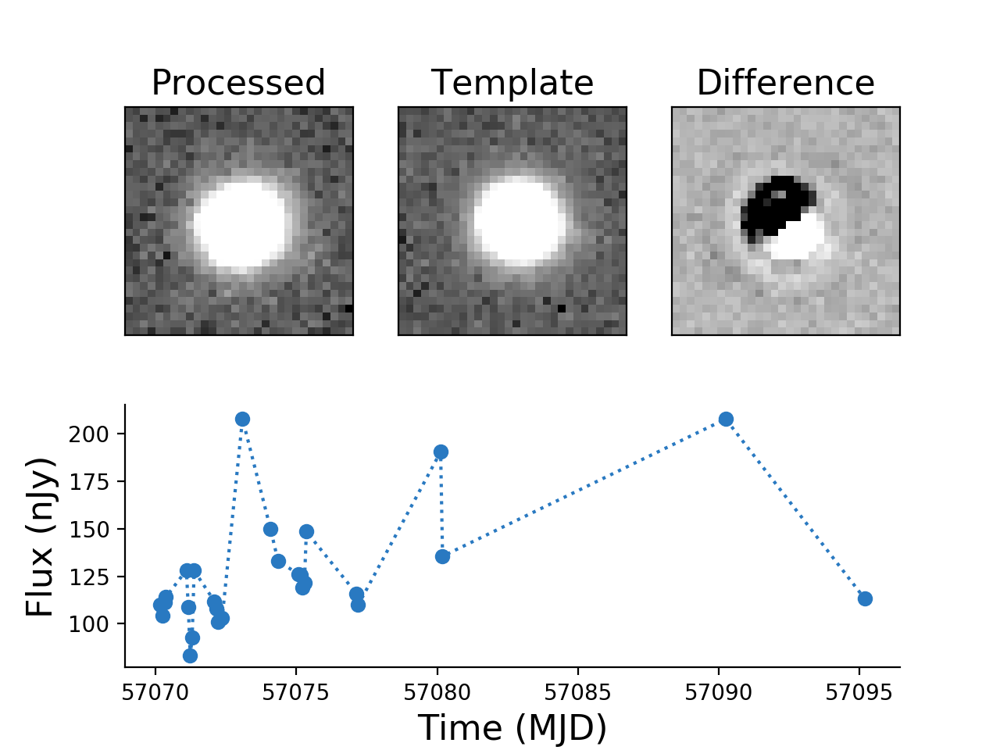

template patch: 11,4
object id: 176492889231065571


<IPython.core.display.Javascript object>


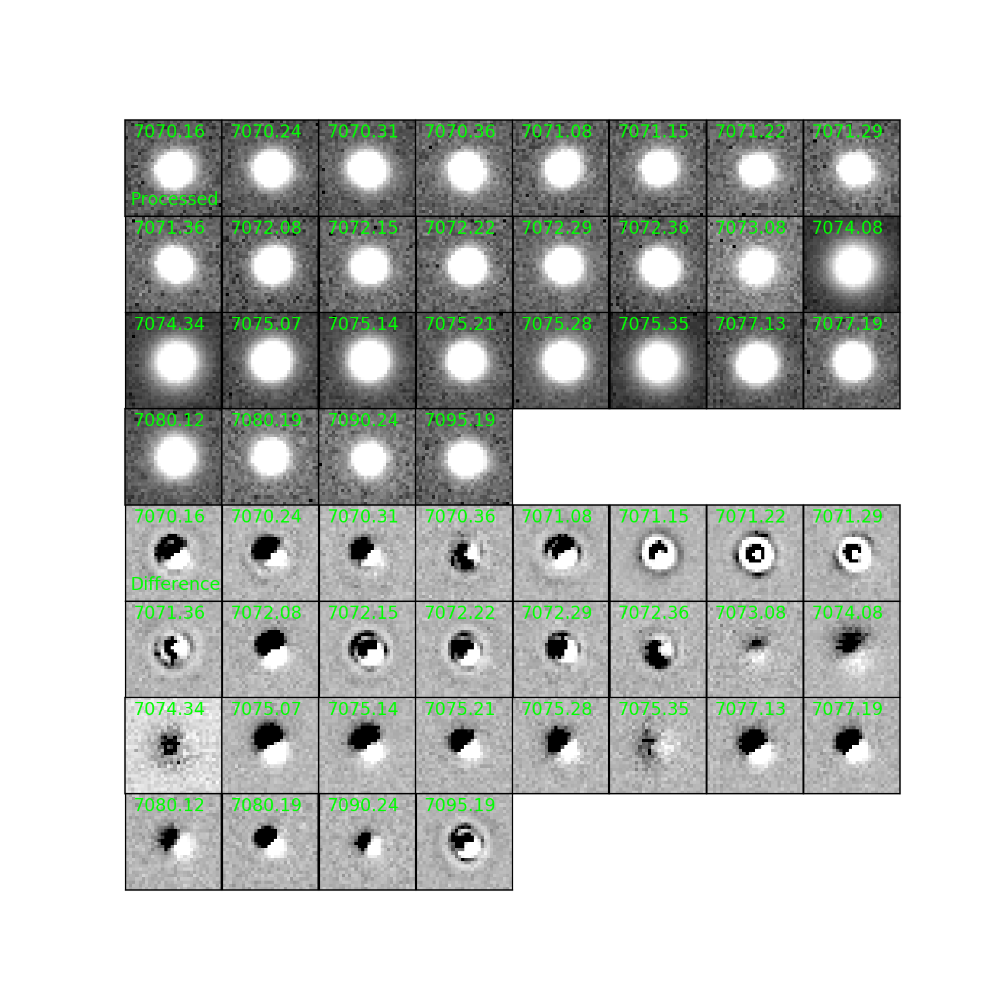

In [162]:
for obj in var_obj_list:
    plot_lightcurve(comRepo, obj, patch=None, addTotFlux=True, findTemplatePatch=True, patchList=patchList, plotAllCutouts=True)

In [163]:
objTableCom.loc[objTableCom['diaObjectId']==176486700183191880]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
431312,176486700183191880,150.644357,2.843325,27,-5.349888e-09,None,0


<IPython.core.display.Javascript object>


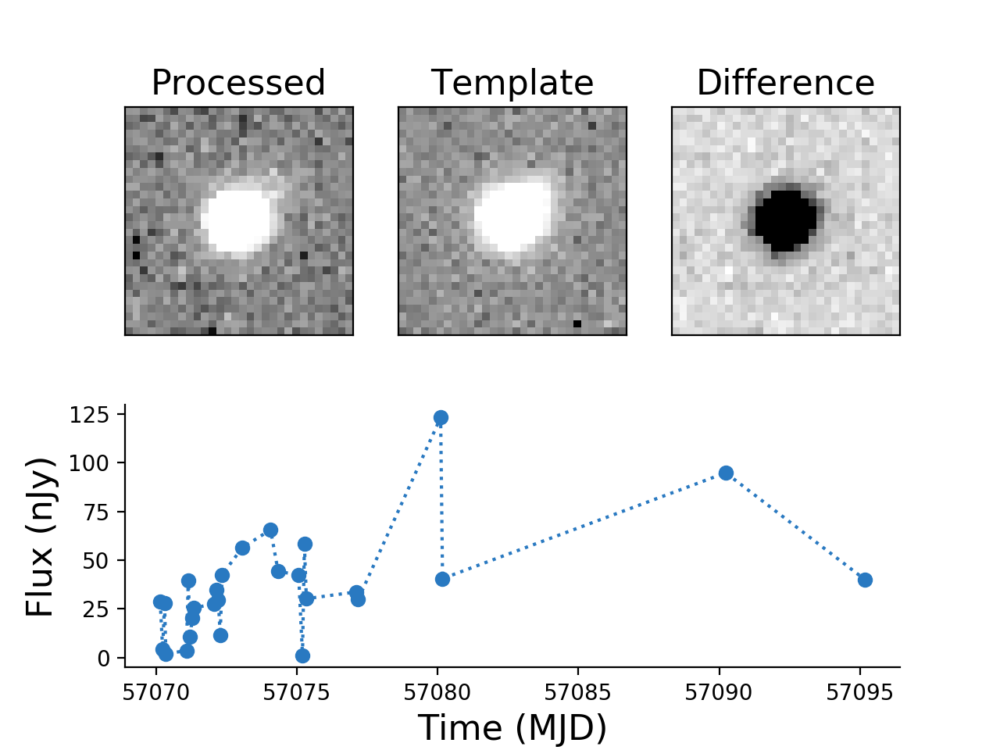

<IPython.core.display.Javascript object>


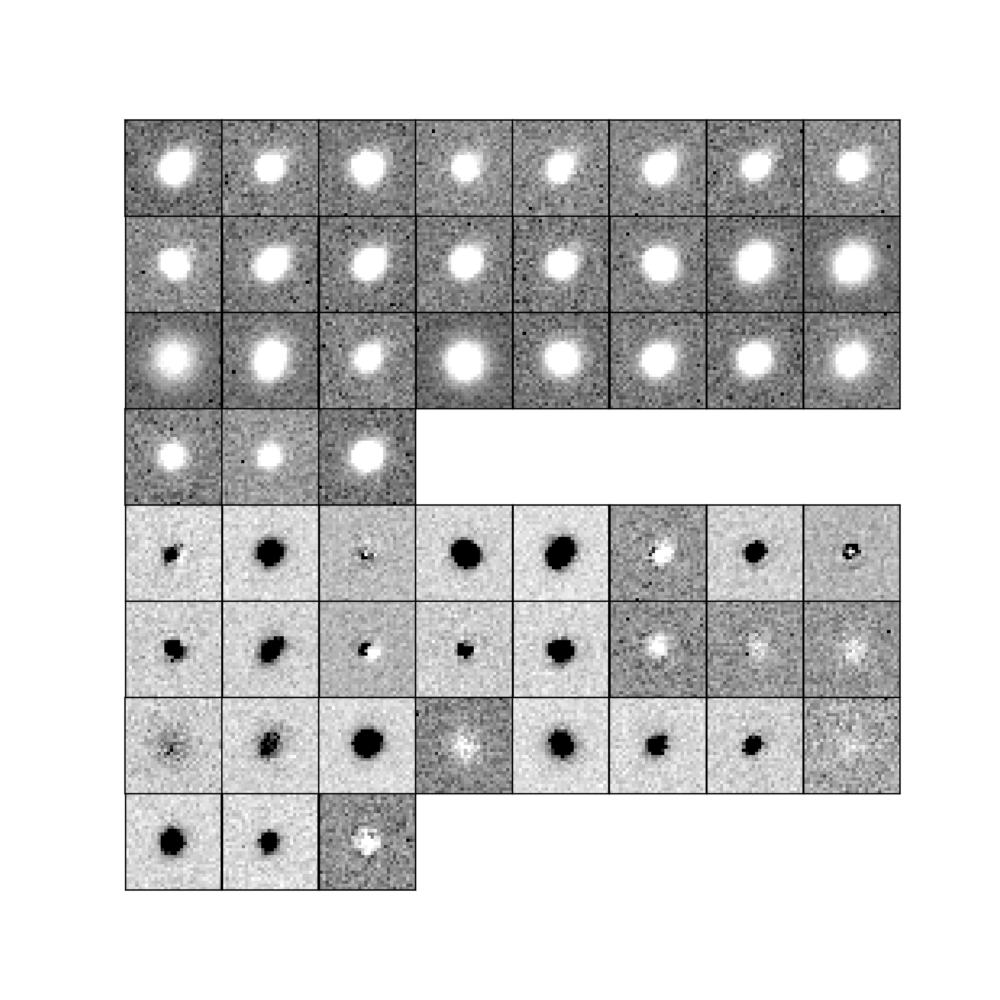

In [168]:
plot_lightcurve(comRepo, 176486700183191880, patch='23,31', addTotFlux=True, plotAllCutouts=True, labelCutouts=False, cutoutIdx=1)

<IPython.core.display.Javascript object>


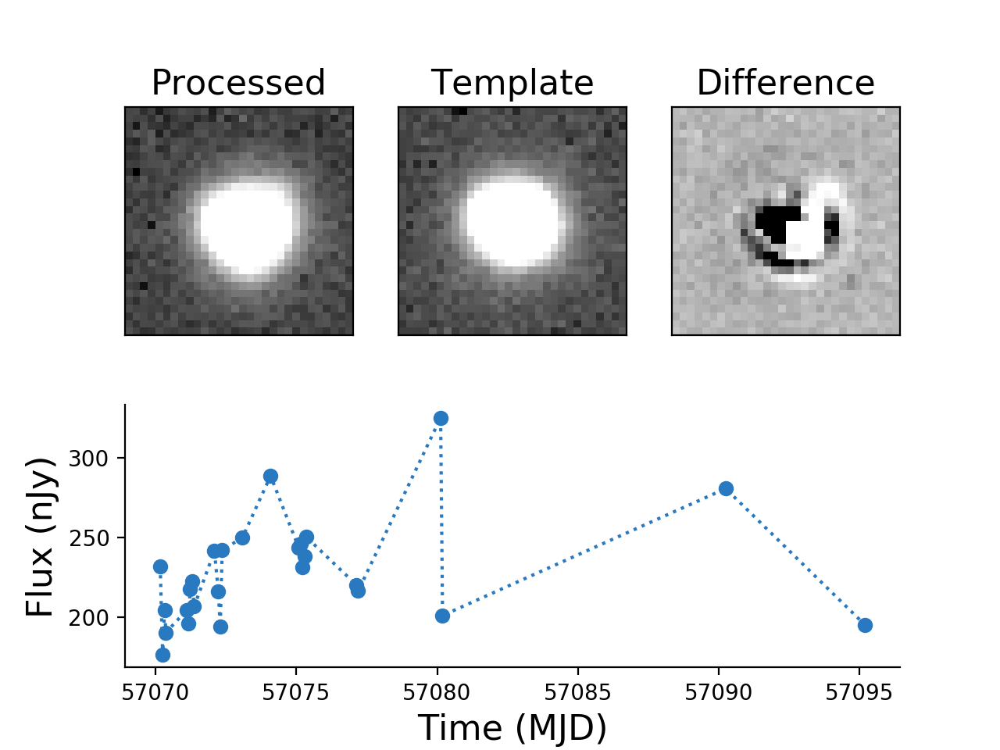

<IPython.core.display.Javascript object>


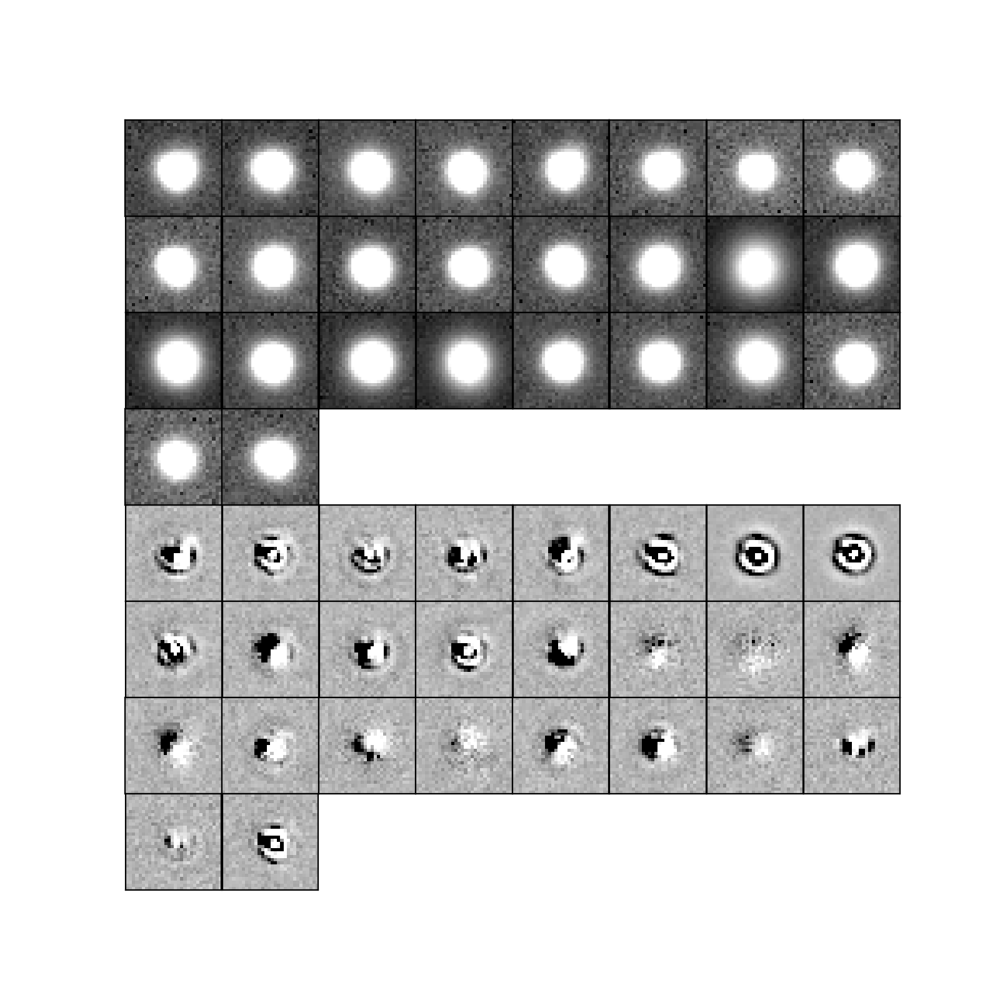

In [169]:
plot_lightcurve(comRepo, 176493786879230374, patch='9,7', addTotFlux=True, plotAllCutouts=True, labelCutouts=False) 